<a href="https://colab.research.google.com/github/nephelim74/PythonDS/blob/main/DZ10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Задание № 1

Анализ данных прогнозирования заработной платы в сфере DataScience:
   - Загрузите датасет ds_salaries
   - Исследуйте данные, чтобы понять их структуру и особенности. Определите типы данных каждой переменной (категориальные или числовые). Проведите описательный анализ целевой переменной "salary".


### Загрузка библиотек

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.tree import plot_tree
import scipy.cluster.hierarchy as sch
from sklearn.metrics import calinski_harabasz_score
import plotly.express as px
from sklearn.manifold import TSNE
from sklearn.metrics import rand_score
from sklearn.cluster import AgglomerativeClustering, SpectralClustering

import warnings
warnings.filterwarnings('ignore')

###Первичный анализ

In [2]:
df = pd.read_csv('ds_salaries.csv')
df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2023,SE,FT,Principal Data Scientist,80000,EUR,85847,ES,100,ES,L
1,2023,MI,CT,ML Engineer,30000,USD,30000,US,100,US,S
2,2023,MI,CT,ML Engineer,25500,USD,25500,US,100,US,S
3,2023,SE,FT,Data Scientist,175000,USD,175000,CA,100,CA,M
4,2023,SE,FT,Data Scientist,120000,USD,120000,CA,100,CA,M


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3755 entries, 0 to 3754
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           3755 non-null   int64 
 1   experience_level    3755 non-null   object
 2   employment_type     3755 non-null   object
 3   job_title           3755 non-null   object
 4   salary              3755 non-null   int64 
 5   salary_currency     3755 non-null   object
 6   salary_in_usd       3755 non-null   int64 
 7   employee_residence  3755 non-null   object
 8   remote_ratio        3755 non-null   int64 
 9   company_location    3755 non-null   object
 10  company_size        3755 non-null   object
dtypes: int64(4), object(7)
memory usage: 322.8+ KB


3755 объектов, 11 признаков. Описание признаков:

`work_year` [categorical] : Это конкретный год, в котором была выплачена заработная плата. В разные годы могут быть разные экономические условия, которые могут повлиять на уровень заработной платы.

`experience_level` [categorical] : уровень опыта, который человек имеет на конкретной работе. Это является ключевым фактором при расчете заработной платы, поскольку, как правило, более опытные сотрудники получают более высокую зарплату благодаря своим передовым навыкам и знаниям.

`employment_type` [categorical] : Характер трудового договора, например, полный рабочий день, неполный рабочий день или по контракту, может существенно влиять на заработную плату. Сотрудники, работающие полный рабочий день, часто получают более высокую годовую заработную плату по сравнению со своими коллегами, работающими неполный рабочий день или по контракту.

`job_title` [categorical] : Должность, которую человек занимает в компании. Разные должности имеют разную шкалу заработной платы в зависимости от требуемых обязанностей и навыков. Например, на руководящих должностях обычно платят больше, чем на должностях начального уровня.

`salary` [numerical] : общая сумма заработной платы, выплачиваемой сотруднику. На это напрямую влияют такие факторы, как уровень опыта, название должности и тип занятости.

`salary_currency` [categorical] : Конкретная валюта, в которой выплачивается заработная плата, обозначаемая кодом ISO 4217. Обменные курсы могут влиять на величину заработной платы при пересчете в разные валюты.

`salaryinusd` [numerical] :  общая сумма заработной платы брутто, пересчитанная в доллары США. Это позволяет проводить единообразное сравнение заработной платы в разных странах и валютах.


`employee_residence` [categorical]: Основная страна проживания сотрудника, обозначаемая кодом ISO 3166. Стоимость жизни и преобладающие ставки заработной платы в стране проживания сотрудника могут влиять на уровень заработной платы.

`remote_ratio` [ratio]: доля работы, выполняемой удаленно. С ростом удаленной работы компании могут корректировать заработную плату в зависимости от стоимости жизни в месте нахождения сотрудника и доли удаленной работы.

`company_location` [categorical]: местоположение главного офиса работодателя или филиала, с которым заключен контракт. Компании в разных регионах могут предлагать разные уровни заработной платы из-за различных экономических условий и стоимости жизни.

`company_size` [categorical]:  Среднее число сотрудников в компании в течение рабочего года. Крупные компании часто имеют структурированную шкалу заработной платы и могут предлагать более высокие оклады за счет эффекта масштаба и увеличения доходов.



In [4]:
df.isna().sum()

,0
work_year,0
experience_level,0
employment_type,0
job_title,0
salary,0
salary_currency,0
salary_in_usd,0
employee_residence,0
remote_ratio,0
company_location,0


In [5]:
duplicate_rows_data = df[df.duplicated()]
print("number of duplicate rows: ", duplicate_rows_data.shape)

number of duplicate rows:  (1171, 11)


In [6]:
for column in df.columns:
    num_distinct_values = len(df[column].unique())
    print(f"{column}: {num_distinct_values} distinct values")

work_year: 4 distinct values
experience_level: 4 distinct values
employment_type: 4 distinct values
job_title: 93 distinct values
salary: 815 distinct values
salary_currency: 20 distinct values
salary_in_usd: 1035 distinct values
employee_residence: 78 distinct values
remote_ratio: 3 distinct values
company_location: 72 distinct values
company_size: 3 distinct values


Выберем численные признаки:

In [7]:
df_numeric = df.select_dtypes(include='number')
df_numeric

,work_year,salary,salary_in_usd,remote_ratio
0,2023,80000,85847,100
1,2023,30000,30000,100
2,2023,25500,25500,100
3,2023,175000,175000,100
4,2023,120000,120000,100
...,...,...,...,...
3750,2020,412000,412000,100
3751,2021,151000,151000,100
3752,2020,105000,105000,100
3753,2020,100000,100000,100


Выберем категориальные признаки:

In [8]:
df_categorical = df.select_dtypes(include='object')
df_categorical

,experience_level,employment_type,job_title,salary_currency,employee_residence,company_location,company_size
0,SE,FT,Principal Data Scientist,EUR,ES,ES,L
1,MI,CT,ML Engineer,USD,US,US,S
2,MI,CT,ML Engineer,USD,US,US,S
3,SE,FT,Data Scientist,USD,CA,CA,M
4,SE,FT,Data Scientist,USD,CA,CA,M
...,...,...,...,...,...,...,...
3750,SE,FT,Data Scientist,USD,US,US,L
3751,MI,FT,Principal Data Scientist,USD,US,US,L
3752,EN,FT,Data Scientist,USD,US,US,S
3753,EN,CT,Business Data Analyst,USD,US,US,L


Сделаем выборку из признаков, содержащих в названии `salary`



In [9]:
salary_features = ['salary', 'salary_currency', 'salary_in_usd']
df[salary_features]

,salary,salary_currency,salary_in_usd
0,80000,EUR,85847
1,30000,USD,30000
2,25500,USD,25500
3,175000,USD,175000
4,120000,USD,120000
...,...,...,...
3750,412000,USD,412000
3751,151000,USD,151000
3752,105000,USD,105000
3753,100000,USD,100000


###Статистические характеристики признаков

Рассмотрим статистические характеристики количественных переменных

In [10]:
df_numeric.describe()

,work_year,salary,salary_in_usd,remote_ratio
count,3755.000000,3.755000e+03,3755.000000,3755.000000
mean,2022.373635,1.906956e+05,137570.389880,46.271638
std,0.691448,6.716765e+05,63055.625278,48.589050
min,2020.000000,6.000000e+03,5132.000000,0.000000
25%,2022.000000,1.000000e+05,95000.000000,0.000000
50%,2022.000000,1.380000e+05,135000.000000,0.000000
75%,2023.000000,1.800000e+05,175000.000000,100.000000
max,2023.000000,3.040000e+07,450000.000000,100.000000


Данные охватывают период с 2020 по 2023 годы.  Средняя зарплата, пересчитанная в доллары США (`salary_in_usd`), составляет приблизительно 137570 долларов, что соответствует типичным зарплатам высокооплачиваемых специалистов.

Столбец `remote_ratio` показывает долю удалённой работы, и его значения варьируются от 0 до 100. Максимальное значение в 100 может указывать на полностью удаленную работу. В среднем (`mean`) этот показатель равен примерно 46, что может указывать на смешанный характер работы (частично удаленная, частично офисная).

Рассмотрим статистические характеристики категориальных переменных

In [11]:
df_categorical.describe()

,experience_level,employment_type,job_title,salary_currency,employee_residence,company_location,company_size
count,3755,3755,3755,3755,3755,3755,3755
unique,4,4,93,20,78,72,3
top,SE,FT,Data Engineer,USD,US,US,M
freq,2516,3718,1040,3224,3004,3040,3153


1. experience_level: Уровень опыта имеет 4 уникальных значения, и большинство (2516 из 3755) записей относятся к категории "SE", что может означать "Senior Expert"

2. employment_type: Вид занятости также имеет 4 уникальных значения, наиболее частым из которых является "FT" (3718 из 3755), что обозначает "Full-Time" или полную занятость.

3. job_title: Наименование должности содержит 93 уникальных значения, и наиболее часто встречающаяся должность - это "Data Engineer" (1040 записей).

4. employee_residence: Страна проживания сотрудника представлена 78 уникальными значениями, преимущественное большинство сотрудников проживают в США (3004 записи).

6. company_location: Местонахождение компании также чаще всего в США (3040 из 3755 записей).

7. company_size: Размер компании имеет всего 3 уникальных значения и наиболее часто встречаемый размер - "M" (3153 записи), что обозначает "Medium" или средний размер компании.


*Дополнительно*   
Чтобы точно сравнить зарплаты за разные годы, важно учитывать инфляцию. Инфляция - это скорость, с которой общий уровень цен на товары и услуги увеличивается с течением времени. Приведя зарплаты в соответствие с общей валютой и годом, мы можем провести значимые сравнения между ними.  

Чтобы привести зарплаты за разные годы к их текущему значению для целей сравнения. Мы будем использовать набор данных, содержащий информацию о зарплатах сотрудников, годах работы и валюте.

**Определить уровень инфляции** для Соединенных Штатов (USA) и мировых рынков. Эти показатели будут использоваться для корректировки заработной платы в зависимости от года и валюты.

In [12]:
us_inflation_rates = {2019: 0.0181, 2020: 0.0123, 2021: 0.0470, 2022: 0.065}
global_inflation_rates = {2019: 0.0219, 2020: 0.0192, 2021: 0.0350, 2022: 0.088}


def adjust_salary(row):
    year = row['work_year']
    original_salary = row['salary_in_usd']
    currency = row['salary_currency']

    if year == 2023:
        return original_salary

    adjusted_salary = original_salary
    for y in range(year, 2023):
        if currency == 'USD':
            inflation_rate = us_inflation_rates[y]
        else:
            inflation_rate = global_inflation_rates[y]

        adjusted_salary *= (1 + inflation_rate)

    return adjusted_salary




df['adjusted_salary'] = df.apply(adjust_salary, axis=1)

In [13]:
df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,adjusted_salary
0,2023,SE,FT,Principal Data Scientist,80000,EUR,85847,ES,100,ES,L,85847.0
1,2023,MI,CT,ML Engineer,30000,USD,30000,US,100,US,S,30000.0
2,2023,MI,CT,ML Engineer,25500,USD,25500,US,100,US,S,25500.0
3,2023,SE,FT,Data Scientist,175000,USD,175000,CA,100,CA,M,175000.0
4,2023,SE,FT,Data Scientist,120000,USD,120000,CA,100,CA,M,120000.0


## Задание № 2

 - Проведите одномерный анализ признаков, используйте визуализацию
 - Проведите анализ взаимодействия признаков, используйте визуализацию
 - *Дополнительно* проведите геопространственный анализ и сделайте выводы по результатам


Рассмотрим признак `job_title`


In [14]:
df.job_title.value_counts()

,count
job_title,
Data Engineer,1040
Data Scientist,840
Data Analyst,612
Machine Learning Engineer,289
Analytics Engineer,103
...,...
Principal Machine Learning Engineer,1
Azure Data Engineer,1
Manager Data Management,1


In [15]:
def assign_broader_category(job_title):
    category_mapping = {
        "Data Engineering": ["Data Engineer", "Data Analyst", "Analytics Engineer", "BI Data Analyst", "Business Data Analyst", "BI Developer", "BI Analyst", "Business Intelligence Engineer", "BI Data Engineer", "Power BI Developer"],
        "Data Science": ["Data Scientist", "Applied Scientist", "Research Scientist", "3D Computer Vision Researcher", "Deep Learning Researcher", "AI/Computer Vision Engineer"],
        "Machine Learning": ["Machine Learning Engineer", "ML Engineer", "Lead Machine Learning Engineer", "Principal Machine Learning Engineer"],
        "Data Architecture": ["Data Architect", "Big Data Architect", "Cloud Data Architect", "Principal Data Architect"],
        "Management": ["Data Science Manager", "Director of Data Science", "Head of Data Science", "Data Scientist Lead", "Head of Machine Learning", "Manager Data Management", "Data Analytics Manager"]
    }

    for category, job_titles in category_mapping.items():
        if job_title in job_titles:
            return category

    return "Other"


In [16]:
df['job_category'] = df['job_title'].apply(assign_broader_category)

In [17]:
df['job_category'].value_counts()

,count
job_category,
Data Engineering,1813
Data Science,985
Other,421
Machine Learning,327
Data Architecture,105
Management,104


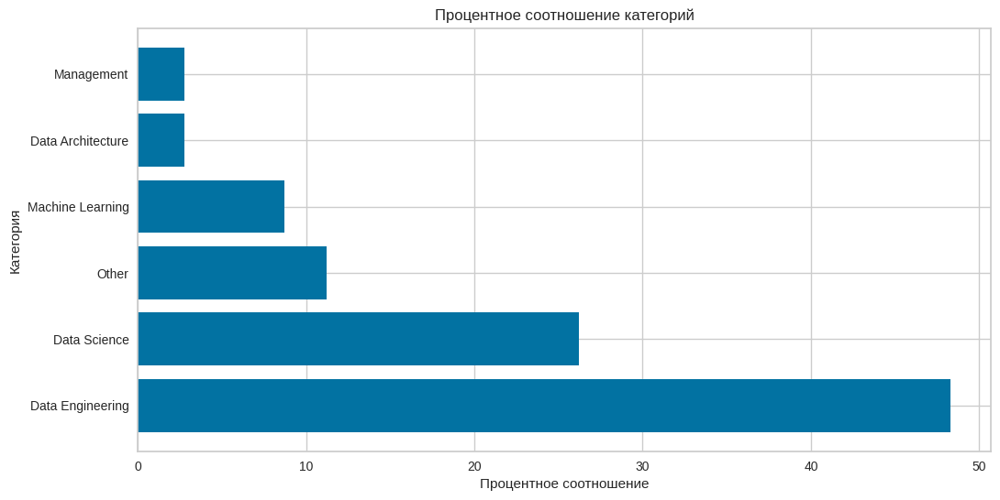

In [18]:
value_counts = df['job_category'].value_counts(normalize=True) * 100

fig, ax = plt.subplots(figsize=(12, 6))
top_n = min(17, len(value_counts))
ax.barh(value_counts.index[:top_n], value_counts.values[:top_n])
ax.set_xlabel('Процентное соотношение')
ax.set_ylabel('Категория')
ax.set_title('Процентное соотношение категорий')
plt.show()

- Категория "Data Engineering" имеет самую большую долю, с процентом близким к 50%.
- "Data Science" следует за ней с процентом, кажется, около 25%.
- Категория "Other" представлена примерно 15%.
- "Machine Learning" составляет чуть меньше 10%.
- "Data Architecture" и "Management" занимают наименьший процент, обе категории находятся ниже 5%.

Распределение по различным типам занятости

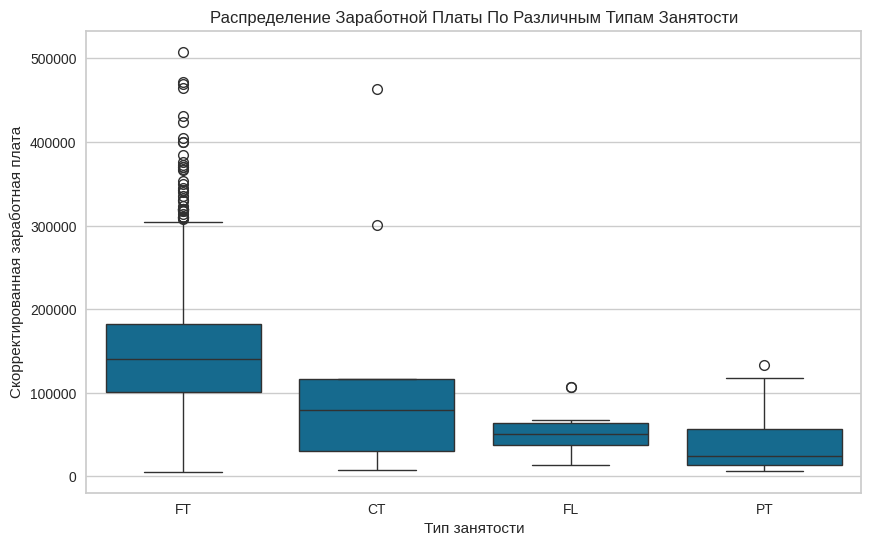

In [19]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='employment_type', y='adjusted_salary')
plt.title('Распределение Заработной Платы По Различным Типам Занятости')
plt.xlabel('Тип занятости')
plt.ylabel('Скорректированная заработная плата')
plt.show()

1. **FT (Полный рабочий день)**:
   - Медиана заработной платы находится ближе к нижней части ящика, что указывает на то, что более 50% работников зарабатывают меньше средней заработной платы.
   - Распределение является асимметричным с правосторонней асимметрией, поскольку усы и выбросы (отдельные точки) простираются довольно высоко, что указывает на наличие значительного числа работников с зарплатой выше медианы.
   - Существует множество выбросов, показывающих индивидуальные случаи с исключительно высокими зарплатами по сравнению с основной массой данных.

2. **CT (Контракт)**:
   - Медиана находится ближе к середине бокса, что указывает на более симметричное распределение заработной платы среди работников по контракту.
   - Распределение имеет меньше выбросов, чем в категории FT.

3. **FL (Фриланс)**:
   - Медианная зарплата ниже, чем в предыдущих категориях, и расположена в верхней части ящика.
   - Диапазон (размах) зарплат в этой категории относительно узкий, и есть очень мало выбросов.

4. **PT (Частичная занятость)**:
   - Медианная зарплата самая низкая среди всех категорий.
   - Ящик относительно узкий, что указывает на меньшее разнообразие в зарплатах.
   - Есть один выброс, показывающий зарплату, которая значительно превышает типичные значения для данной категории.

adjusted_salary: mu = 142445.66, sigma = 64692.98
adjusted_salary: Skewness: 0.58
adjusted_salary: Kurtosis: 1.14


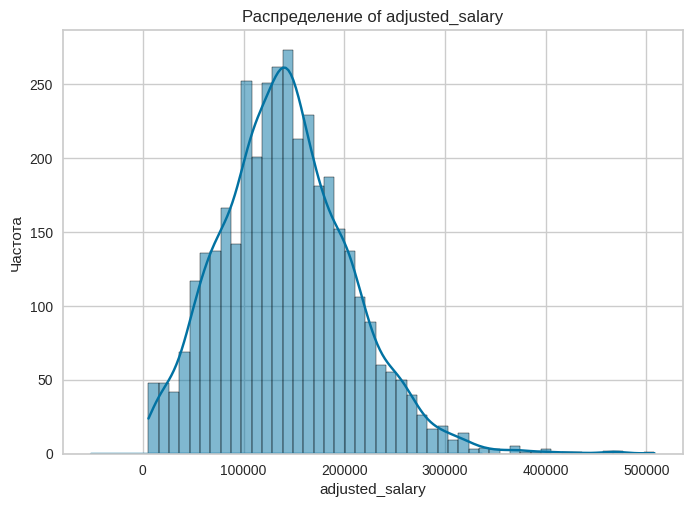

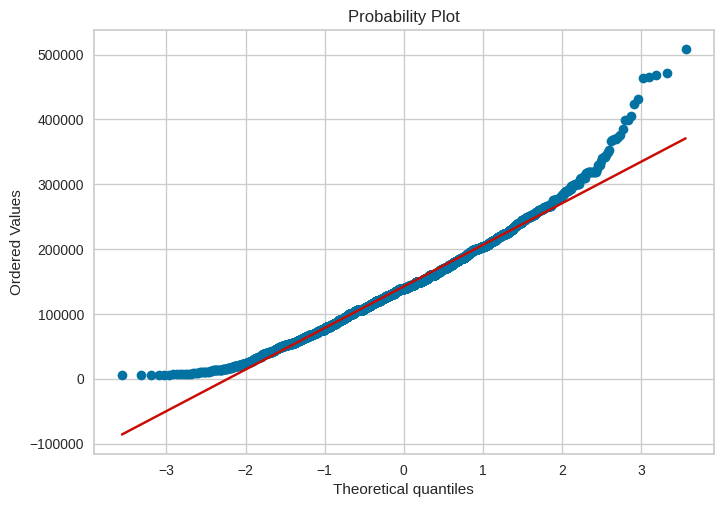

In [20]:
columns = ['adjusted_salary']

for col in columns:

    sns.histplot(df[col], kde=True)

    (mu, sigma) = stats.norm.fit(df[col])
    print('{}: mu = {:.2f}, sigma = {:.2f}'.format(col, mu, sigma))

    print('{}: Skewness: {:.2f}'.format(col, df[col].skew()))
    print('{}: Kurtosis: {:.2f}'.format(col, df[col].kurt()))

    x = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
    y = stats.norm.pdf(x, mu, sigma)
    plt.plot(x, y, label='Normal fit')

    plt.xlabel(col)
    plt.ylabel('Частота')
    plt.title('Распределение of {}'.format(col))

    fig = plt.figure()
    stats.probplot(df[col], plot=plt)

    plt.show()

Распределение имеет положительное асимметричное смещение (Skewness = 0.54), что указывает на то, что более тяжёлый "хвост" распределения находится справа. Кроме того, эксцесс (Kurtosis = 0.83) немного выше, чем для нормального распределения, что указывает на более острые пики и тяжелые хвосты распределения. Среднее значение (mu) заработной платы составляет примерно 137 579.39 долларов США, со стандартным отклонением (sigma) около 63 047.23 долларов США.

вероятностный график (Probability Plot), на котором синими точками показаны отсортированные значения заработной платы по их теоретическим квантилям. Красная линия представляет собой линию, которую можно было бы ожидать, если бы данные имели идеальное нормальное распределение. График показывает, что данные отклоняются от нормального распределения, особенно в его хвостах (обе стороны графика поднимаются выше и опускаются ниже красной линии), что указывает на наличие выбросов или тяжёлых хвостов.

Многомерный анализ

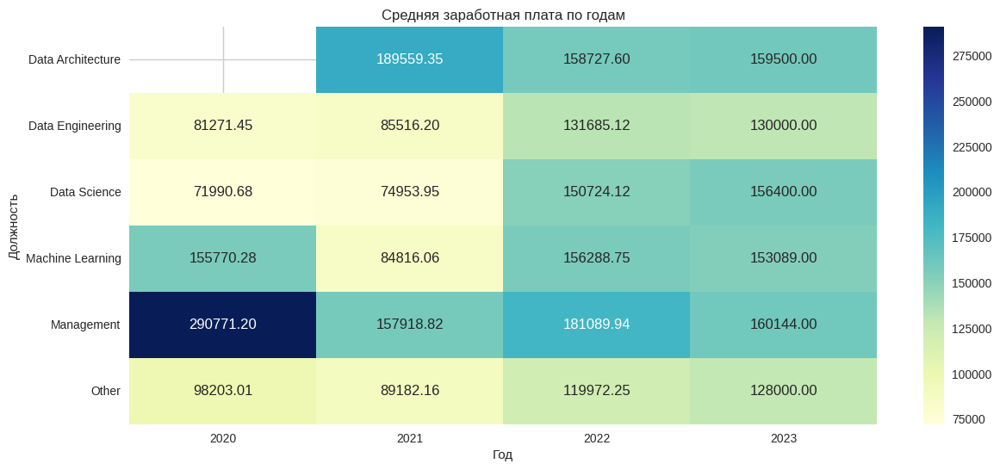

In [21]:
pivot_table = df.pivot_table(values='adjusted_salary', index='job_category', columns='work_year', aggfunc='median')
plt.figure(figsize=(14, 6))
sns.heatmap(pivot_table, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title('Средняя заработная плата по годам')
plt.xlabel('Год')
plt.ylabel('Должность')
plt.show()

Зарплаты в Management категории находятся на самом высоком уровне по сравнению с другими представленными специальностями. Они начинаются от порядка 257,600 в 2020 году и слегка снижаются до 160,144 в 2023 году.

1. Различия в остальных категориях менее значительны, однако каждая из них показывает рост медианной зарплаты с течением времени. Например, в Data Engineering зарплаты возросли с 72,000 в 2020 году до 130,000 в 2023 году.

2. В категории Machine Learning наблюдается рост с 138,000 в 2020 году до 153,089 в 2023 году.

3. В категории Data Science также виден постепенный рост: начиная от 62,726 в 2020 году и достигнув 156,400 в 2023 году.

4. Data Architecture и Other показывают стабильный рост медианной зарплаты с каждым годом, хотя они начинают и заканчивают период с самых низких показателей среди представленных групп.


Сравнение заработной платы между местом жительства сотрудника и местонахождением компании

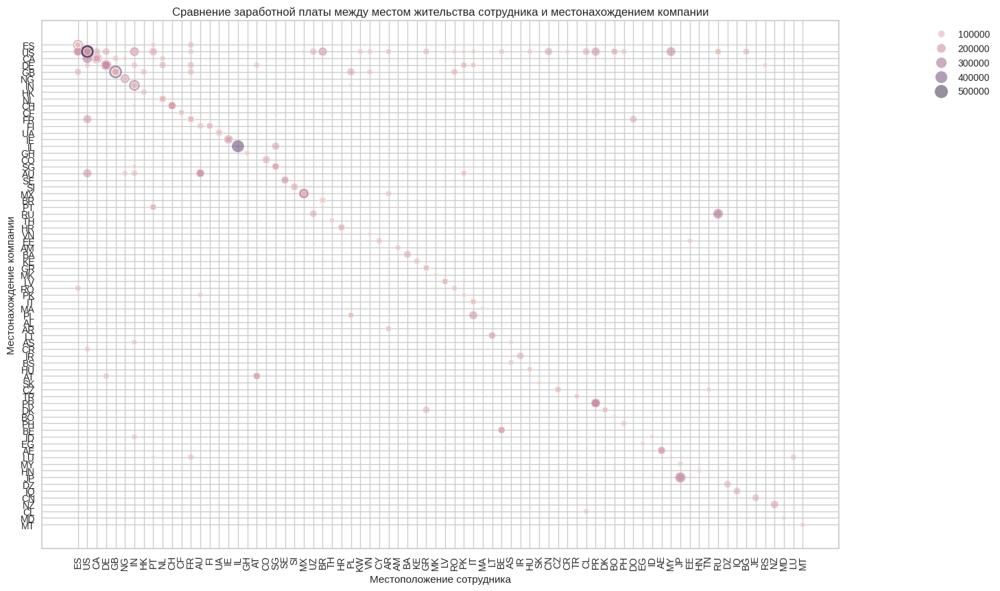

In [22]:
plt.figure(figsize=(15, 10))
sns.scatterplot(data=df, x='employee_residence', y='company_location', hue='adjusted_salary', size='adjusted_salary',\
                sizes=(20, 200), alpha=0.5)
plt.title('Сравнение заработной платы между местом жительства сотрудника и местонахождением компании')
plt.xlabel('Местоположение сотрудника')
plt.ylabel('Местонахождение компании')
plt.xticks(rotation=90)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.show()

###Стандартизация численных признаков и кодировка категориальные признаки

In [23]:
categorical_columns = ['experience_level', 'employment_type', 'remote_ratio','company_size','job_category']
numerical_columns = ['adjusted_salary']

In [24]:
dummy_variables = pd.get_dummies(df, columns=categorical_columns, drop_first=False)

In [25]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

scaled_numerical = scaler.fit_transform(df[numerical_columns])

scaled_numerical_df = pd.DataFrame(scaled_numerical, columns=numerical_columns)

In [26]:
dummy_variables = dummy_variables.drop(numerical_columns, axis=1)

processed_df = pd.concat([dummy_variables, scaled_numerical_df], axis=1)
processed_df = processed_df.drop(['work_year', 'salary','salary_in_usd'], axis=1)

In [27]:
processed_df_copy = processed_df.drop(processed_df.select_dtypes(include = 'object'), axis = 1)

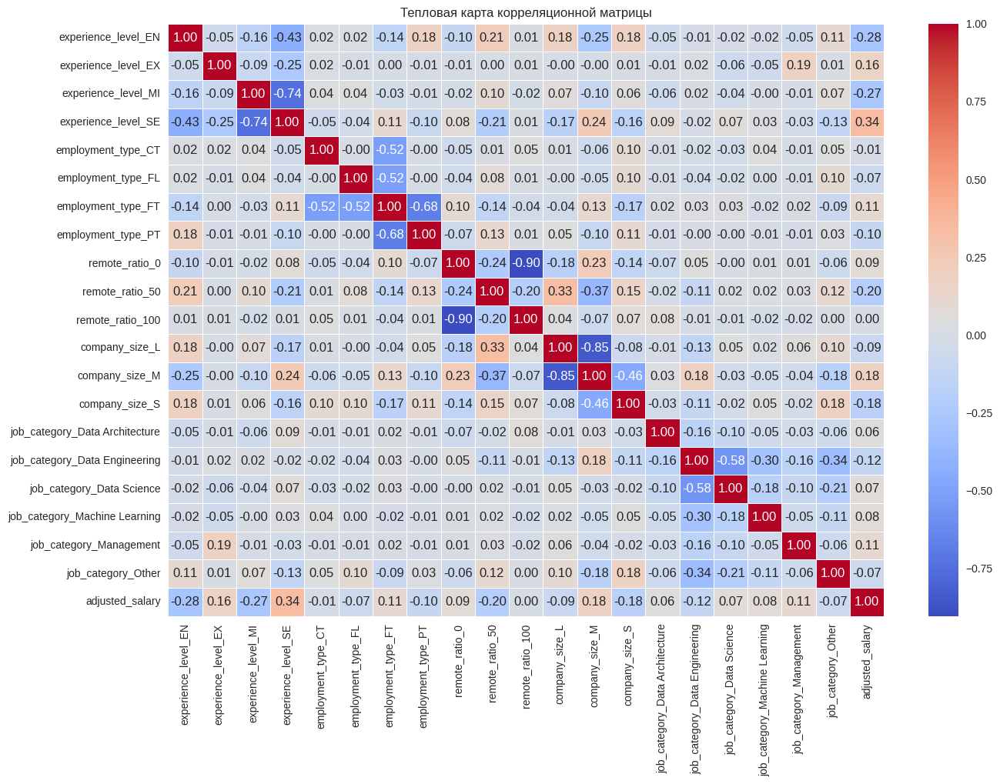

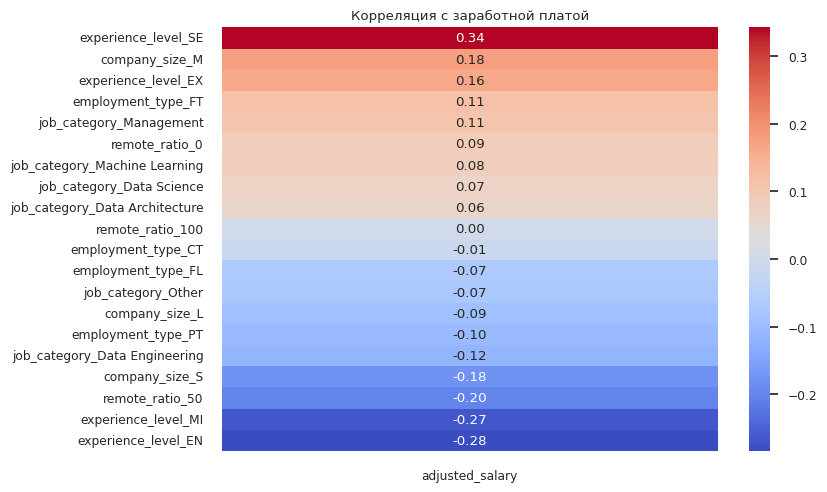

In [28]:
correlation_matrix = processed_df_copy.corr()

plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title("Тепловая карта корреляционной матрицы")
plt.show()

corr = processed_df_copy.corr()
target_corr = corr['adjusted_salary'].drop('adjusted_salary')

target_corr_sorted = target_corr.sort_values(ascending=False)


sns.set(font_scale=0.8)
sns.set_style("white")
sns.set_palette("PuBuGn_d")
sns.heatmap(target_corr_sorted.to_frame(), cmap="coolwarm", annot=True, fmt='.2f')
plt.title('Корреляция с заработной платой')
plt.show()


Положительные значения корреляции (красный цвет) показывают, что между параметром и заработной платой существует прямая связь: выше значение параметра, выше зарплата. Отрицательные значения корреляции (синий цвет) говорят о том, что между параметром и зарплатой обратная связь: выше значение параметра, ниже зарплата.

Наиболее значимые положительные корреляции:
1. experience_level_SE (0.34) - предположительно, уровень опыта Senior Engineer имеет сильную положительную корреляцию с заработной платой.
2. company_size_M (0.18) - размер компании средний (Medium) имеет умеренную положительную корреляцию с зарплатой.
3. experience_level_EX (0.16) - очень высокий уровень опыта (Expert) также имеет положительную корреляцию с зарплатой.

Наиболее значимые отрицательные корреляции:
1. experience_level_EN (-0.28) - начальный уровень опыта (Entry-level Engineer) имеет сильную отрицательную корреляцию с заработной платой.
2. experience_level_MI (-0.27) - средний уровень опыта (Mid-level Engineer) имеет также отрицательную корреляцию с заработной платой.
3. remote_ratio_50 (-0.20) и company_size_S (-0.18) - работа на 50% удаленно и небольшой размер компании имеют умеренно отрицательную корреляцию с зарплатой.

Другие параметры также имеют разные уровни корреляции с заработной платой, но их значения меньше по абсолютной величине, что указывает на менее сильную связь с зарплатой.


###Разделение на обучающую и тестовую выборки


In [29]:
X = processed_df_copy.drop(["adjusted_salary"], axis=1)
y = processed_df_copy["adjusted_salary"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [31]:
lr = LinearRegression()
lr.fit(X_train, y_train)
y_train_pred = lr.predict(X_train)
print(f'MSE: {mean_squared_error(y_train, y_train_pred)},\
\nMAE :{mean_absolute_error( y_train, y_train_pred)},\
\n R2: {r2_score(y_train, y_train_pred)}')

MSE: 0.7536623415177856,
MAE :0.6643744411999858,
 R2: 0.24920640396820715


In [ ]:
y_test_pred = lr.predict(X_test)
print(f'MSE: {mean_squared_error( y_test, y_test_pred)},\
\nMAE :{mean_absolute_error( y_test, y_test_pred)},\
\n R2: {r2_score(y_test, y_test_pred)}')

MSE: 0.7774790472274613,
MAE :0.6899452752288477,
 R2: 0.20928704614647675


Результаты на обучающей выборке:
   - MSE -- 0.7564822330058492
   - MAE -- 0.6636938928580131
   - R2 -- 0.24639724613437008

   Эти значения указывают на качество модели на обучающих данных. R2 близок к 0.25, что свидетельствует о низкой объясняющей способности модели.

4. В следующем блоке кода не видно, здесь уже идёт работа с тестовой выборкой:
   - Делается предсказание (`y_test_pred`) для тестовой выборки.
   - Выводятся метрики ошибок: MSE, MAE и R2 для тестового набора данных.

5. Результаты на тестовой выборке:
   - MSE -- 0.7757148894649355
   - MAE -- 0.6903550389717388
   - R2 -- 0.2110812326725051

   Эти результаты несколько хуже, чем на обучающем наборе: коэффициент детерминации немного ниже (около 0.21), что означает, что модель несколько хуже объясняет вариативность тестовой выборки по сравнению с обучающей выборкой.

В целом, результаты указывают на то, что модель линейной регрессии не обеспечивает высокого качества прогнозирования для представленных данных, так как R2 довольно низкий как на обучающих, так и на тестовых данных. Это может говорить о том, что между предикторами и целевой переменной имеются нелинейные зависимости, или в данных недостаточно информации для обучения модели, или, возможно, потребуются более сложные модели для предсказания.

**Построение модели дерева решений**

In [32]:
tree_model = DecisionTreeRegressor(random_state=42)
tree_model.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

In [34]:
# Прогноз и оценка качества модели
y_tree_pred = tree_model.predict(X_test)
rmse = mean_squared_error(y_test, y_tree_pred)
r2_tree = r2_score(y_test, y_tree_pred)

print(f'RMSE: {rmse}, R²: {r2_tree}')

RMSE: 0.7721556936950982, R²: 0.2147010114629594


In [35]:
# Подбор гиперпараметров
param_grid = {'max_depth': [3, 5, 7, 10], 'min_samples_split': [2, 5, 10]}
grid_search = GridSearchCV(DecisionTreeRegressor(random_state=42), param_grid, cv=5)
grid_search.fit(X_train, y_train)

print('Лучшие параметры:', grid_search.best_params_)

Лучшие параметры: {'max_depth': 5, 'min_samples_split': 10}


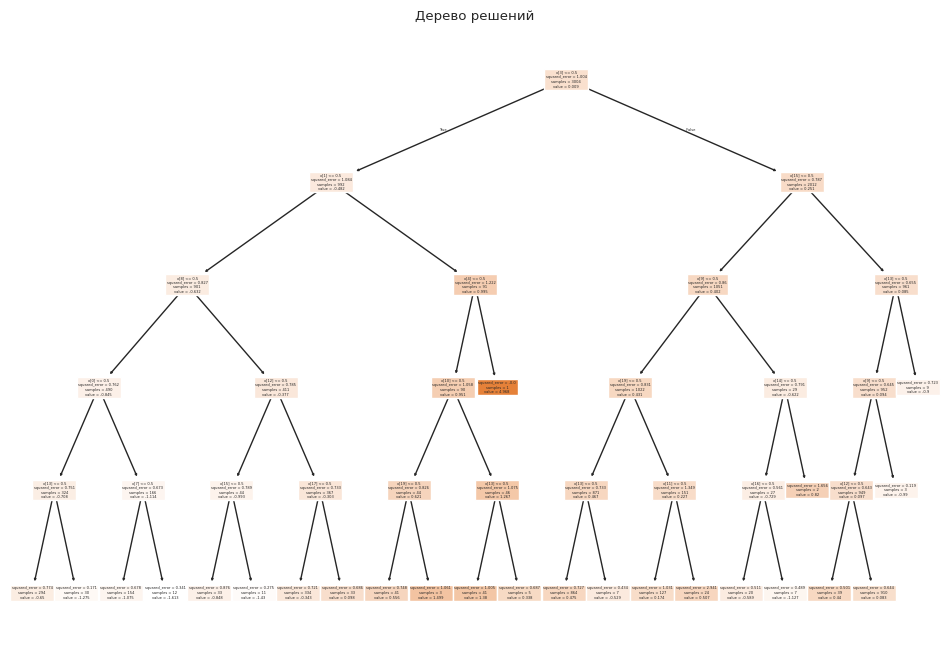

In [36]:
# Визуализация дерева

plt.figure(figsize=(12, 8))
plot_tree(grid_search.best_estimator_, filled=True)
plt.title("Дерево решений")
plt.show()

Разбиение получилось достаточно неплохим. Модель лучше отрабатывает при значениях {'max_depth': 5, 'min_samples_split': 10}. Модель немного лучше работает по метрикам RMSE и R² чем линейная регрессия.

Построение ансамблевой модели

In [38]:
# Модель Random Forest
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)
y_rf_pred = rf_model.predict(X_test)
rf_r2 = r2_score(y_test, y_rf_pred)

In [39]:
# Модель Gradient Boosting
gb_model = GradientBoostingRegressor(random_state=42)
gb_model.fit(X_train, y_train)
y_gb_pred = gb_model.predict(X_test)
gb_r2 = r2_score(y_test, y_gb_pred)

In [40]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 6.6 MB/s eta 0:00:00


In [41]:
#Модель CatBoost

from catboost import CatBoostRegressor

In [42]:
regressor = CatBoostRegressor(iterations=1500, depth=4, learning_rate=0.01)
regressor.fit(X_train, y_train, verbose=False)
predictions = regressor.predict(X_test)
cb_r2 = r2_score(y_test, predictions)

In [ ]:
print(f'Random Forest R²: {rf_r2}, Gradient Boosting R²: {gb_r2}, CatBoost R²: {cb_r2}')

Random Forest R²: 0.21832057897591528, Gradient Boosting R²: 0.22429985393921292, CatBoost R²: 0.2255008342596252


По метрике R² ансамблевые модели лучше показывают предсказательную способность чем модель дерево решений.

Определяем важность признаков:

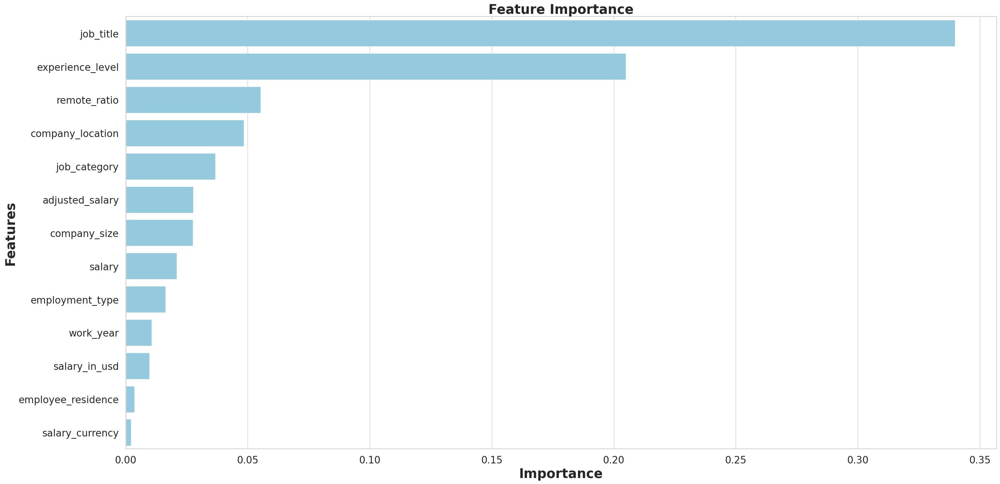

None

,Features,Gini-Importance
0,job_title,0.339881
1,experience_level,0.204938
2,remote_ratio,0.055325
3,company_location,0.048450
4,job_category,0.036818
5,adjusted_salary,0.027693
6,company_size,0.027473
7,salary,0.020872
8,employment_type,0.016372
9,work_year,0.010652


In [43]:
feats = {}
for feature, importance in zip(df.columns, rf_model.feature_importances_):
    feats[feature] = importance
importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
importances = importances.sort_values(by='Gini-Importance', ascending=False)
importances = importances.reset_index()
importances = importances.rename(columns={'index': 'Features'})
sns.set(font_scale = 5)
sns.set(style="whitegrid", color_codes=True, font_scale = 1.7)
fig, ax = plt.subplots()
fig.set_size_inches(30,15)
sns.barplot(x=importances['Gini-Importance'], y=importances['Features'], data=importances, color='skyblue')
plt.xlabel('Importance', fontsize=25, weight = 'bold')
plt.ylabel('Features', fontsize=25, weight = 'bold')
plt.title('Feature Importance', fontsize=25, weight = 'bold')
display(plt.show())
display(importances)

**Понижение размерности с помощью PCA**

Метод главных компонент может быть полезен в задаче классификации при большом количестве признаков, так как значительно улучшает результаты работы ансамблевых методов. Однако в данном случае решается задача кластеризации, поэтому он будет использоваться только для упрощения восприятия данных в виде двумерного и трехмерного графиков.

In [44]:
pca = PCA(n_components=0.95)  # сохраняем 95% дисперсии
X_pca = pca.fit_transform(X)

In [45]:
# Модель линейной регрессии с использованием PCA
X_train_pca, X_test_pca = train_test_split(X_pca, test_size=0.2, random_state=42)
model_pca = LinearRegression()
model_pca.fit(X_train_pca, y_train)

LinearRegression()

In [ ]:
y_pca_pred = model_pca.predict(X_test_pca)
pca_mae = mean_absolute_error(y_test, y_pca_pred)
pca_mse = mean_squared_error(y_test, y_pca_pred)
pca_r2 = r2_score(y_test, y_pca_pred)

print(f'PCA MAE: {pca_mae}, PCA MSE: {pca_mse}, PCA R²: {pca_r2}')

PCA MAE: 0.689635452898666, PCA MSE: 0.7741646251460454, PCA R²: 0.2126578848638152


После понижения размерности данных(использование РСА) метрики MAE и MSE практически не изменились. А метрика R² повыслась на доли процентов. Это говорит о том, что применение алгоритма РСА не повлияло на улучшение модели линейной регрессии, скорее это связано с тем, что у нас даннывх мало, и связь между ними более чем линейная.

**Кластеризация**

Из того, что большинство признаков имеют отличное от нормального распределение, следует, что стандартизация не лучший вариант. Вместно нее лучше подойдет MinMax.

In [47]:
# MinMaxScaler масштабирует данные так, чтобы все значения находились в диапазоне от 0 до 1.
# mms.fit_transform(processed_df_copy) применяет масштабирование к данным.
# Результат масштабирования преобразуется обратно в DataFrame с сохранением исходных названий столбцов.
mms = MinMaxScaler()
processed_df_copy = pd.DataFrame(mms.fit_transform(processed_df_copy), columns=processed_df_copy.columns)
# MinMaxScaler():
# Создает объект для масштабирования данных.
# fit_transform():
# fit вычисляет минимальное и максимальное значения для каждого столбца.
# transform применяет масштабирование на основе вычисленных значений.
# pd.DataFrame():
# Преобразует масштабированные данные обратно в DataFrame, сохраняя названия столбцов.

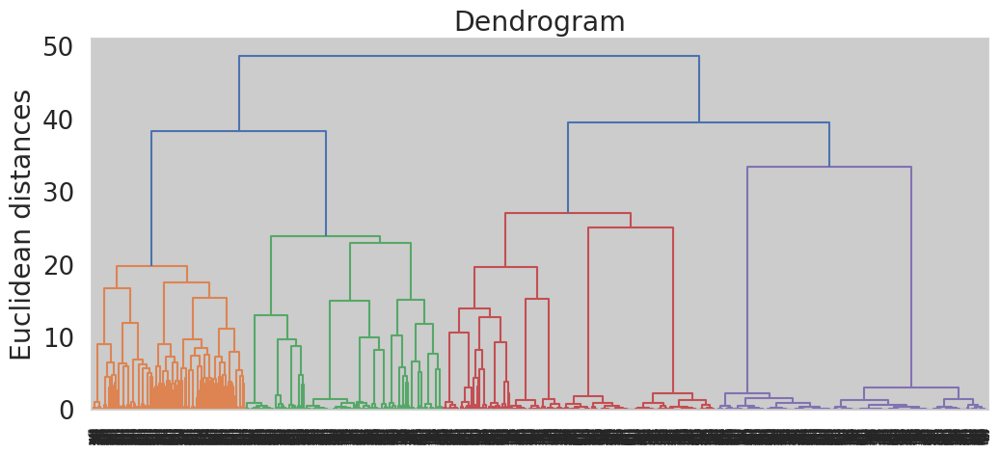

In [48]:
plt.figure(figsize=(12, 5))
dendrogram = sch.dendrogram(sch.linkage(processed_df_copy, method = 'ward'))
plt.title('Dendrogram')
plt.ylabel('Euclidean distances')
plt.show()

# sch.linkage(processed_df_copy, method='ward'):
# Вычисляет иерархическую кластеризацию с использованием метода ward, который минимизирует дисперсию внутри кластеров.

# sch.dendrogram():
# Строит дендрограмму на основе результатов кластеризации.

# plt.figure(figsize=(12, 5)):
# Задает размер графика.

# plt.title(), plt.ylabel():
# Добавляют заголовок и подпись оси Y.

# plt.show():
# Отображает график.

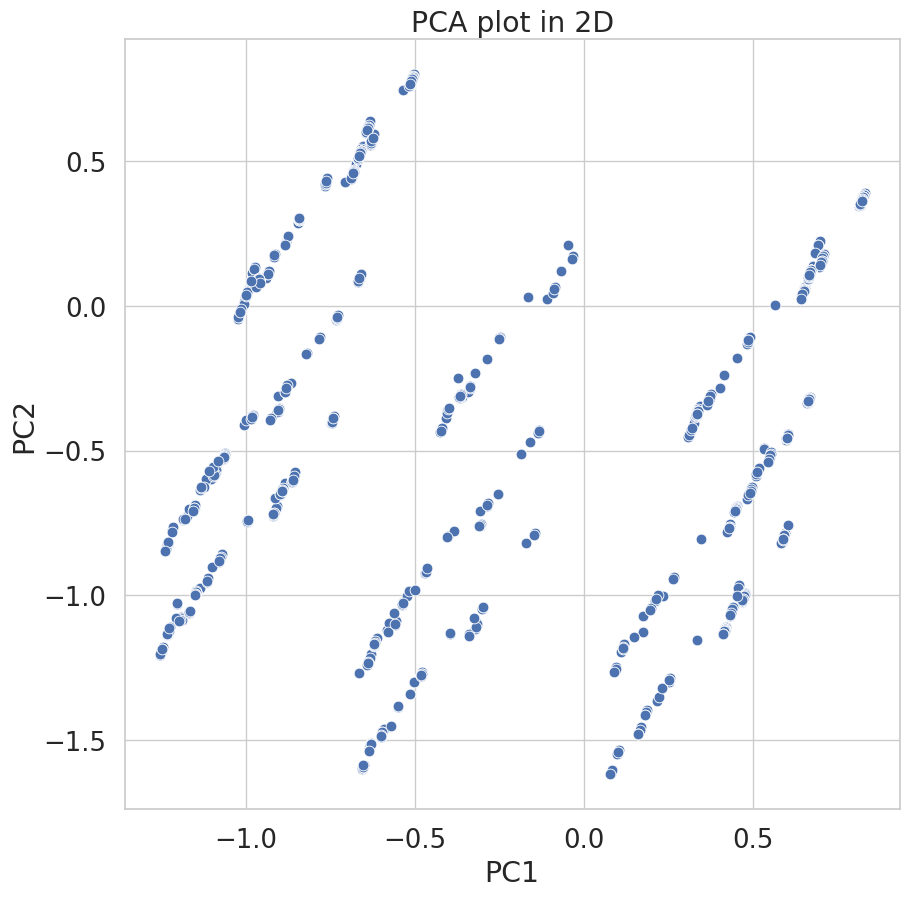

In [50]:
principal_df = pd.DataFrame(data = PCA(n_components=2).fit_transform(processed_df_copy))

fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x = principal_df.iloc[:,0],
                y = principal_df.iloc[:,1],
                s=60)

plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2');

# PCA(n_components=2):
# Снижает размерность данных до 2 компонент (основных компонент).

# fit_transform(processed_df_copy):
# Применяет PCA к данным и возвращает преобразованные данные.

# pd.DataFrame():
# Преобразует результат в DataFrame для удобства работы.

# sns.scatterplot():
# Строит scatter plot для визуализации данных в 2D.

# plt.title(), plt.xlabel(), plt.ylabel():
# Добавляют заголовок и подписи осей.

In [51]:
def TSNEplot(pred=None):
    tsne = TSNE(random_state=1)

    X_tsne = tsne.fit_transform(processed_df_copy)

    plt.figure(figsize=(12, 10))
    plt.scatter(X_tsne[:, 0],
                X_tsne[:, 1],
                c = pred,
                edgecolor="none",
                alpha=0.7, s=40,
        cmap=plt.cm.get_cmap("flare", 3))

    plt.colorbar()
    plt.title("t-SNE projection");

# TSNE(random_state=1):
# Создает объект t-SNE с фиксированным random_state для воспроизводимости результатов.

# fit_transform(processed_df_copy):
# Применяет t-SNE к данным и возвращает их представление в 2D.

# plt.scatter():
# Строит scatter plot для визуализации данных.

# c=pred:
# Использует массив pred для цветовой дифференциации точек (например, метки кластеров или классов).

# cmap=plt.cm.get_cmap("flare", 3):
# Задает цветовую карту для визуализации.

# plt.colorbar():
# Добавляет цветовую шкалу для интерпретации цветов.

# plt.title():
# Добавляет заголовок графика.

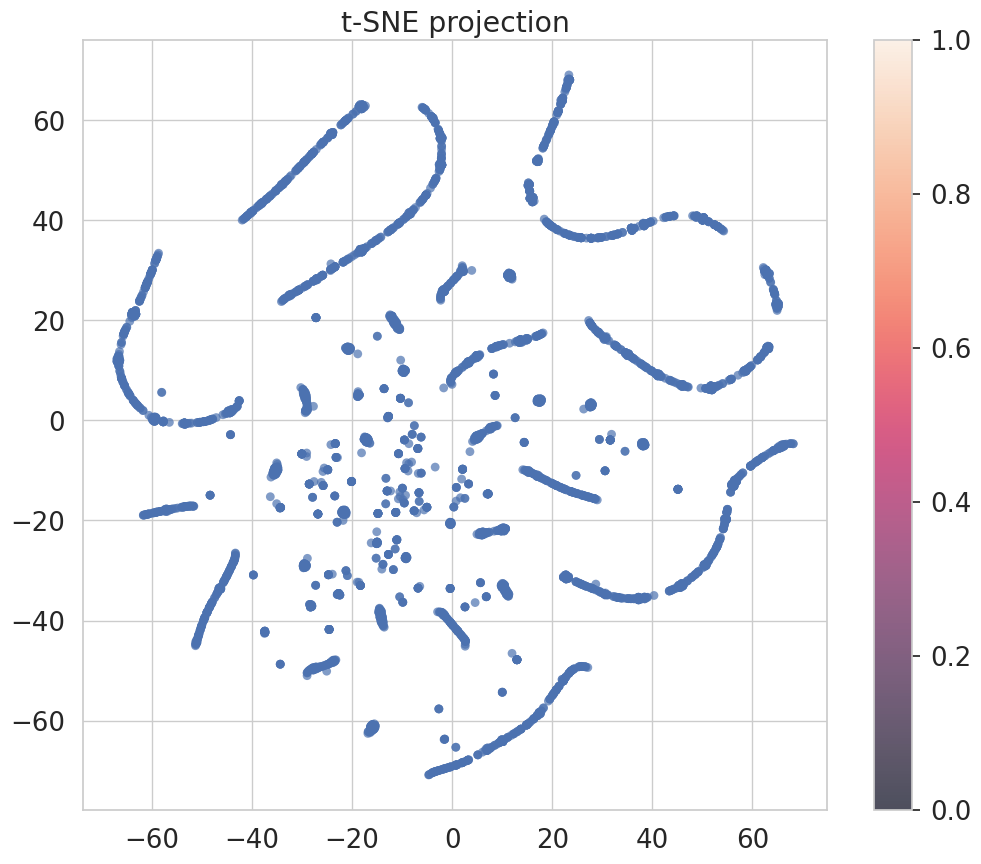

In [52]:
TSNEplot()

In [54]:
def PCAplot3D(x_data, y_data=None):
    components = PCA(n_components=3).fit_transform(x_data)

    fig = px.scatter_3d(
        components,
        x=0, y=1, z=2,
        color=y_data,
        size=0.1*np.ones(len(X)),
        opacity = 1,
        title='PCA plot in 3D',
        labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'},
        width=900, height=900
    )
    fig.show()

In [55]:
PCAplot3D(processed_df_copy)

**Выбор метода кластеризации**

Кластеризация ассоциируется с методом k-средних. Однако он не являтся единственным, только в библиотеке scikit-learn представлено 11 методов, некоторые из них могут решать общие задачи, другие - лучше справятся с определенным типом.

*В данном случае известно следующее:*

Набор данных разбит на 3 класса
Количество данных не слишком велико
При визуальном осмотре можно выделить 3 кластера
Проекция на плоскость имеет достаточно большую дисперсию
Выбор пал на методы K-Means, Spectral Clustering, DBSCAN и Agglomerative Clustering by Ward. Главным параметром у них является число кластеров, а на графике распределения, схожим с нашим, методы демонстрируют достаточно хорошую работу.

**K-Means**

In [56]:
pca = PCA(n_components=2)

kmeans = KMeans(n_clusters=3, random_state=1, n_init='auto').fit(processed_df_copy)
centroids_pca = pca.fit_transform(kmeans.cluster_centers_)
pred_k = kmeans.labels_

principal_df = pd.DataFrame(data = PCA(n_components=2).fit_transform(processed_df_copy))


# PCA(n_components=2):
# Снижает размерность данных до 2 компонент для визуализации.

# KMeans(n_clusters=3, random_state=1, n_init='auto'):
# Выполняет кластеризацию данных на 3 кластера.

# kmeans.cluster_centers_:
# Возвращает центры кластеров в исходном пространстве.

# centroids_pca = pca.fit_transform(kmeans.cluster_centers_):
# Преобразует центры кластеров в пространство PCA.

# pred_k = kmeans.labels_:
# Возвращает метки кластеров для каждого объекта.

# principal_df:
# Создает DataFrame с данными, преобразованными в 2D-пространство PCA.

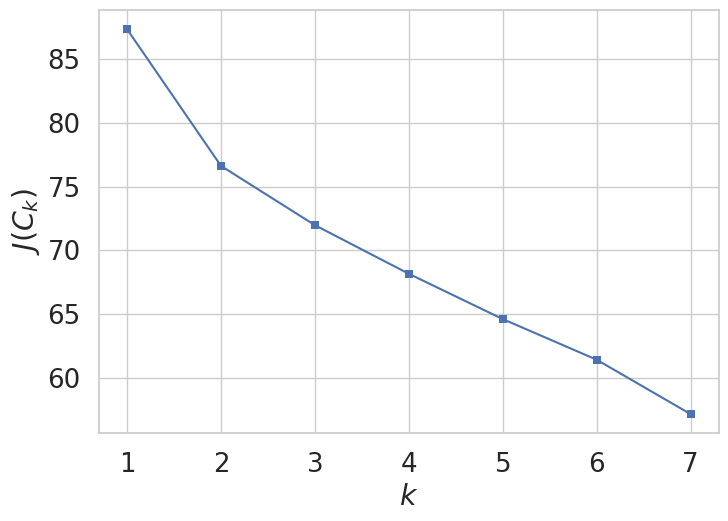

In [58]:
inertia = []
for k in range(1, 8):
    kmeans = KMeans(n_clusters=k, random_state=1, n_init='auto').fit(processed_df_copy)
    inertia.append(np.sqrt(kmeans.inertia_))

plt.plot(range(1, 8), inertia, marker="s")
plt.xlabel("$k$")
plt.ylabel("$J(C_k)$");


# inertia = []:
# Создает список для хранения значений инерции.

# Цикл for k in range(1, 8):
# Выполняет K-means для
# k
# k от 1 до 7.

# kmeans.inertia_:
# Возвращает инерцию (сумму квадратов расстояний от точек до центров их кластеров).

# np.sqrt(kmeans.inertia_):
# Вычисляет квадратный корень от инерции для лучшей интерпретации.

# plt.plot():
# Строит график зависимости инерции от количества кластеров.

# plt.xlabel() и plt.ylabel():
# Добавляют подписи осей.

In [61]:
pca = PCA(n_components=2)


kmeans = KMeans(n_clusters=3, random_state=1, n_init='auto').fit(processed_df_copy)
centroids_pca = pca.fit_transform(kmeans.cluster_centers_)
pred_k = kmeans.labels_

principal_df = pd.DataFrame(data = PCA(n_components=2).fit_transform(processed_df_copy))

# PCA(n_components=2):
# Снижает размерность данных до 2 компонент для визуализации.

# KMeans(n_clusters=3, random_state=1, n_init='auto'):
# Выполняет кластеризацию данных на 3 кластера.

# kmeans.cluster_centers_:
# Возвращает центры кластеров в исходном пространстве.

# centroids_pca = pca.fit_transform(kmeans.cluster_centers_):
# Преобразует центры кластеров в пространство PCA.

# pred_k = kmeans.labels_:
# Возвращает метки кластеров для каждого объекта.

# principal_df:
# Создает DataFrame с данными, преобразованными в 2D-пространство PCA.


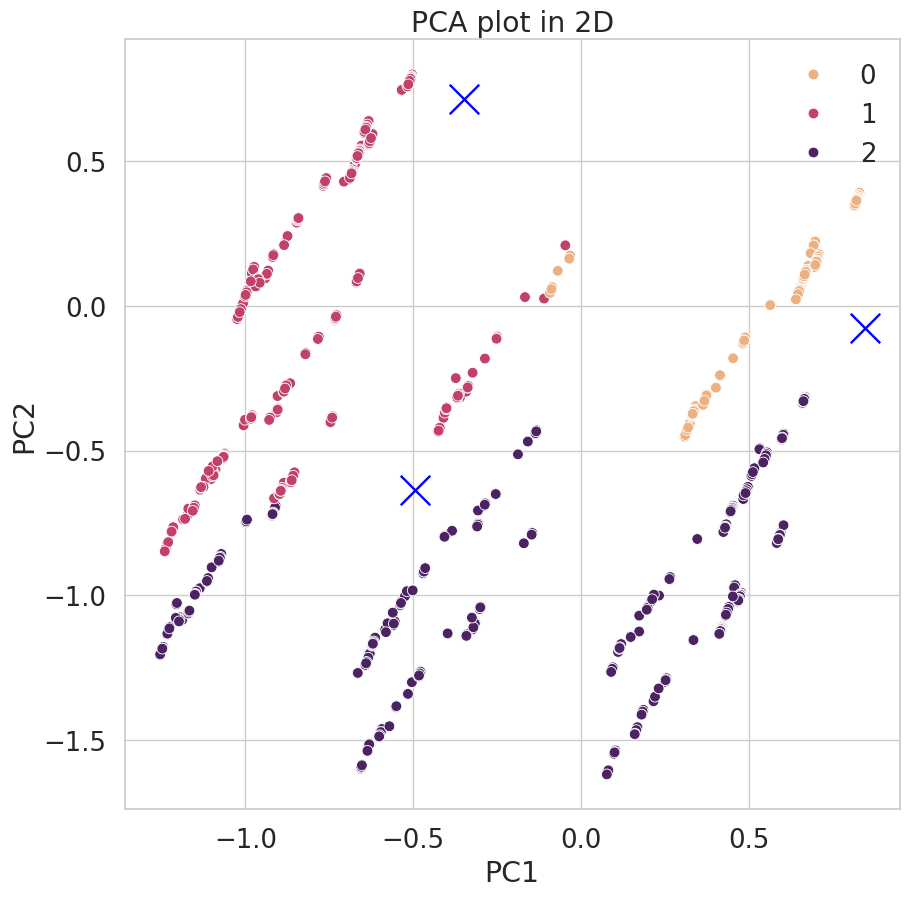

In [62]:
fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x = principal_df.iloc[:,0],
                y = principal_df.iloc[:,1],
                hue = pred_k,
                palette="flare",
                s=60)
sns.scatterplot(x = centroids_pca[:,0],
                y =  centroids_pca[:,1],
                marker="x",
                s=450,
                color = 'blue')
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2');



# fig = plt.figure(figsize=(10, 10)):
# Создает фигуру размером 10x10 для графика.

# sns.scatterplot():

# Первый вызов строит scatter plot для данных, преобразованных в 2D-пространство PCA, с цветовой дифференциацией по кластерам (hue=pred_k).

# Второй вызов добавляет центры кластеров на график, обозначая их крестиками (marker="x").

# palette="flare":
# Задает цветовую палитру для кластеров.

# plt.title(), plt.xlabel(), plt.ylabel():
# Добавляют заголовок и подписи осей.

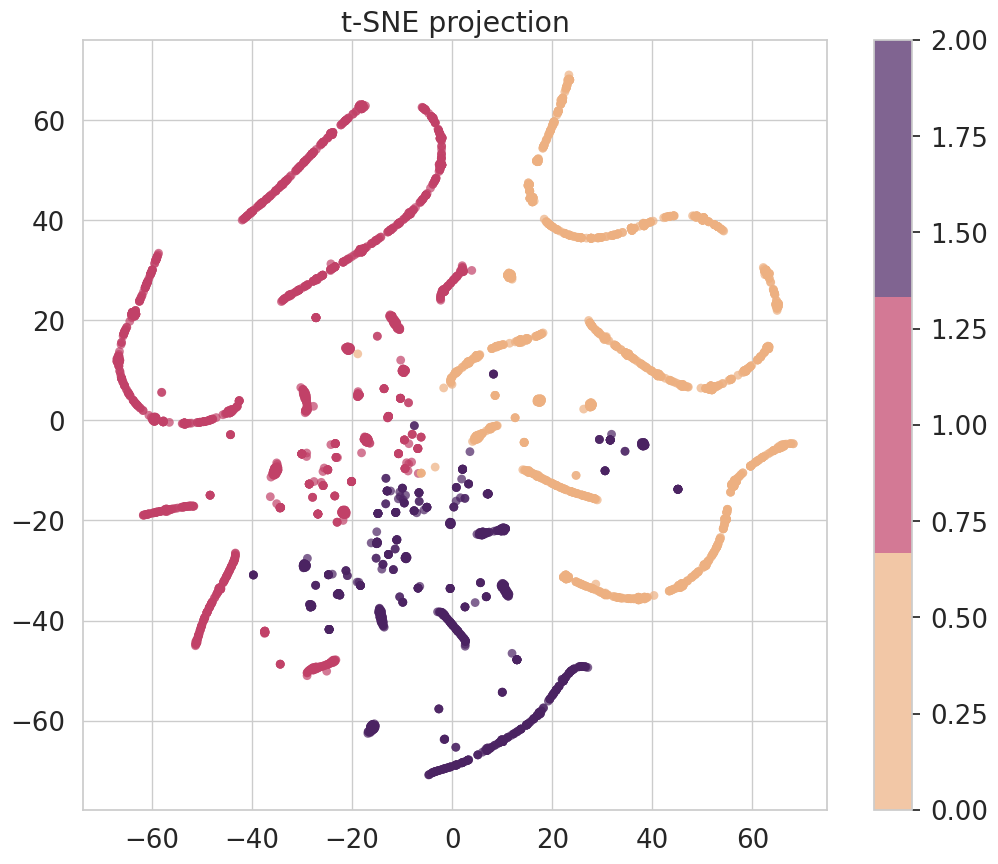

In [63]:
TSNEplot(pred_k)

In [64]:
PCAplot3D(processed_df_copy, pred_k)

silhouette - оценка сходства между объектами внутри одного кластера и различия между кластерами,то есть, на сколько близки объекты в одном кластере (среднее расстояние от объекта до других объектов в этом же кластере (значение a в формуле) и среднее расстояние от объекта до других объектов в других кластерах (значение b в формуле) по отношению к максимальному числу среди данных двух чисел)

variance ration criterion - отношение межкластерной дисперсии (сумма квадратов расстояний между центроидами кластеров и общим центроидом) и отношение внутрикластерной дисперсии (сумма квадратов расстояний от каждой точки до своего центроида кластера)

In [ ]:
silhouette = silhouette_score(X, pred_k)
chi = calinski_harabasz_score(X, pred_k)
print('\nK-Means')
print('_'*45 + '\n')
print('Силуэт', round(silhouette,3))
print('Variance Rarion Criterion', round(chi,3))
rs_k = rand_score(kmeans.labels_, y)
print(" rand_score = {} \n\n {} из 3755 предсказано верно \n".format(rs_k, rs_k * 3755))


K-Means
_____________________________________________

Силуэт 0.292
Variance Rarion Criterion 895.765
 rand_score = 0.6475356956130948 

 2431.4965370271707 из 3755 предсказано верно 



**Silhouette 0.29:**

Значение силуэта 0,29 указывает на умеренную кластеризацию. Это значит, что кластеры имеют перекрытия.

**Variance Rarion Criterion 896:**

Значение Variance Rarion Criterion 896 указывает на умеренную дисперсию кластеров. Это значит, что кластеры достаточно компактны.

**Rand Score 0,65:**

Rand Score 0,65 говорит о том, что 65% объектов правильно предсказаны кластерами. Это немного больше среднего.
2431 из 3755 предсказано верно:

Около 65% объектов правильно предсказаны. Это подтверждает умеренную кластеризацию.

**Построим распределения по каждому кластеру**

In [ ]:
df_cluster = processed_df_copy.copy()
df_cluster['K-Means'] = pred_k

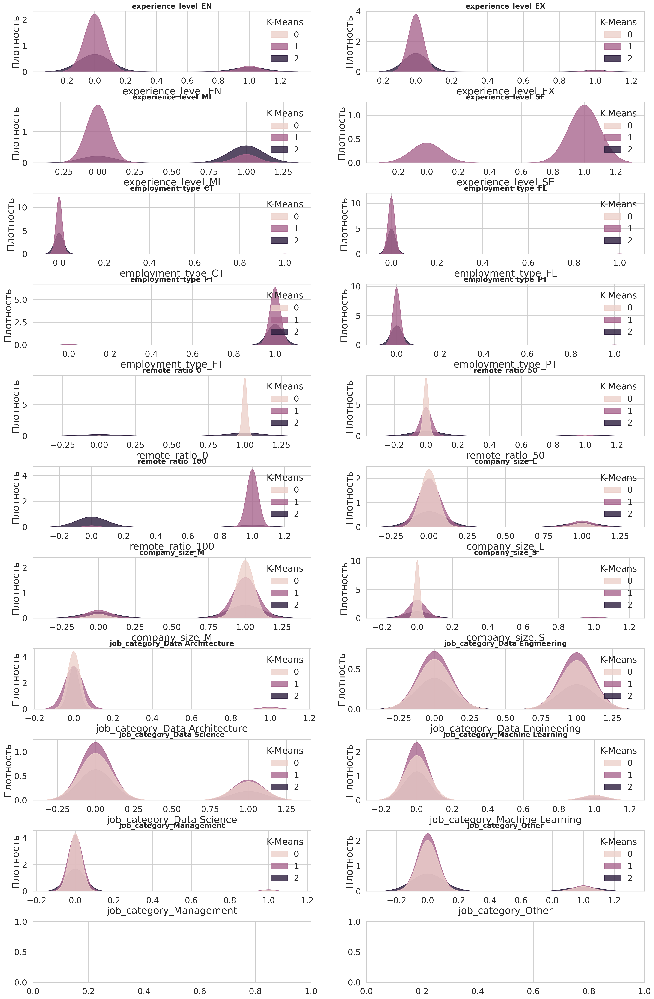

In [ ]:
# Создаем матрицу графиков для визуализации распредления по каждой переменной
fig, axes = plt.subplots(11,2, figsize = (25,40), dpi=200)

# Расстояние между графиками
plt.subplots_adjust(hspace=0.5)

# Список значений признаков для цикла
columns = processed_df_copy.columns[:-1]

# Строим распределения (kdeplot) для каждого признака
for i, column in enumerate(columns):
    ax = axes[i // 2, i % 2]
    sns.kdeplot(data = df_cluster,
                x = column,
                fill = True,
                alpha = 0.8,
                hue = 'K-Means',
                ax = ax)

    ax.set_title(column, fontweight = 'bold', fontsize = 16)
    ax.set_xlabel(column, fontsize = 22)
    ax.set_ylabel('Плотность', fontsize = 22)

**Agglomerative Clustering by Ward**

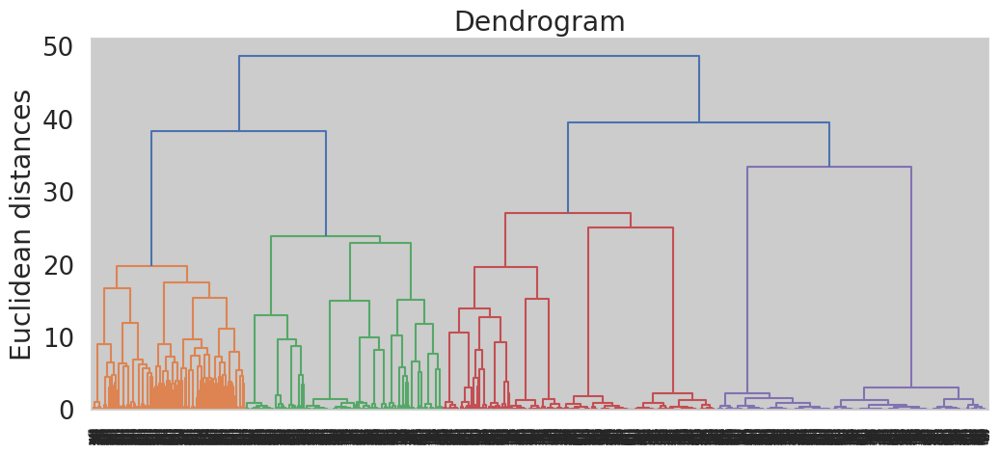

In [ ]:
from matplotlib import pyplot
pyplot.figure(figsize=(12, 5))
dendrogram = sch.dendrogram(sch.linkage(processed_df_copy, method = 'ward'))
plt.title('Dendrogram')
plt.ylabel('Euclidean distances')
plt.show()

In [ ]:
clustering_ward = AgglomerativeClustering(3).fit(processed_df_copy)
pred_ward = clustering_ward.labels_

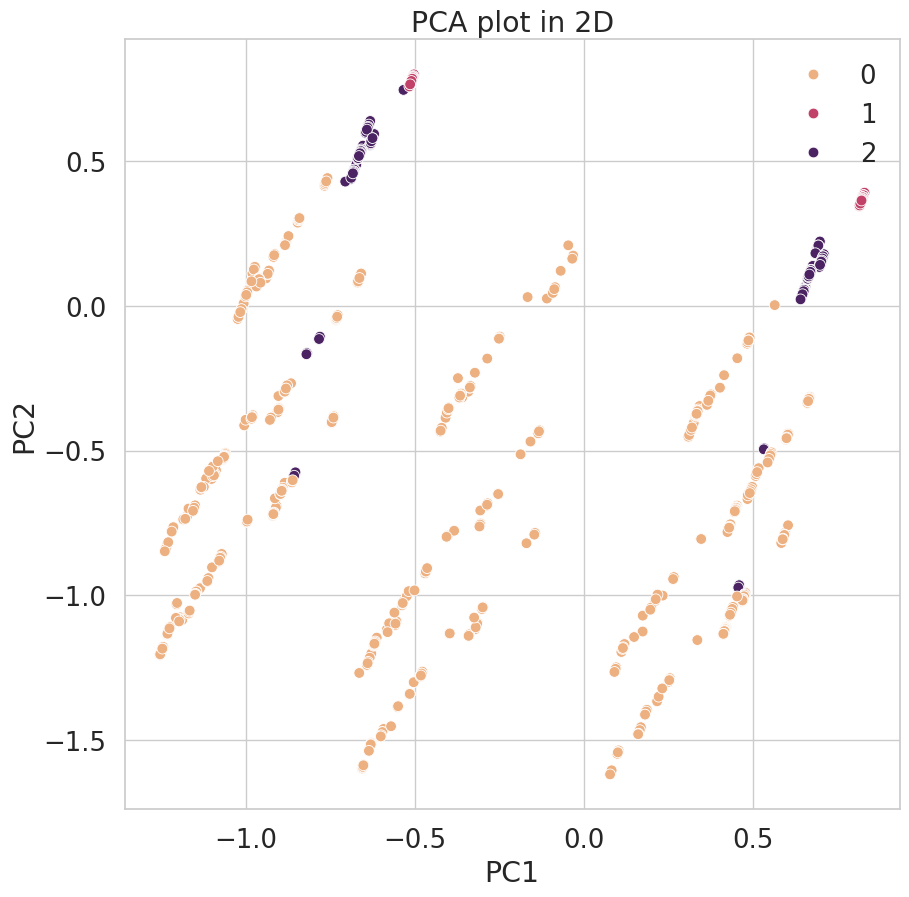

In [ ]:
fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x = principal_df.iloc[:,0],
                y = principal_df.iloc[:,1],
                hue = pred_ward,
                palette="flare",
                s=60)
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2');

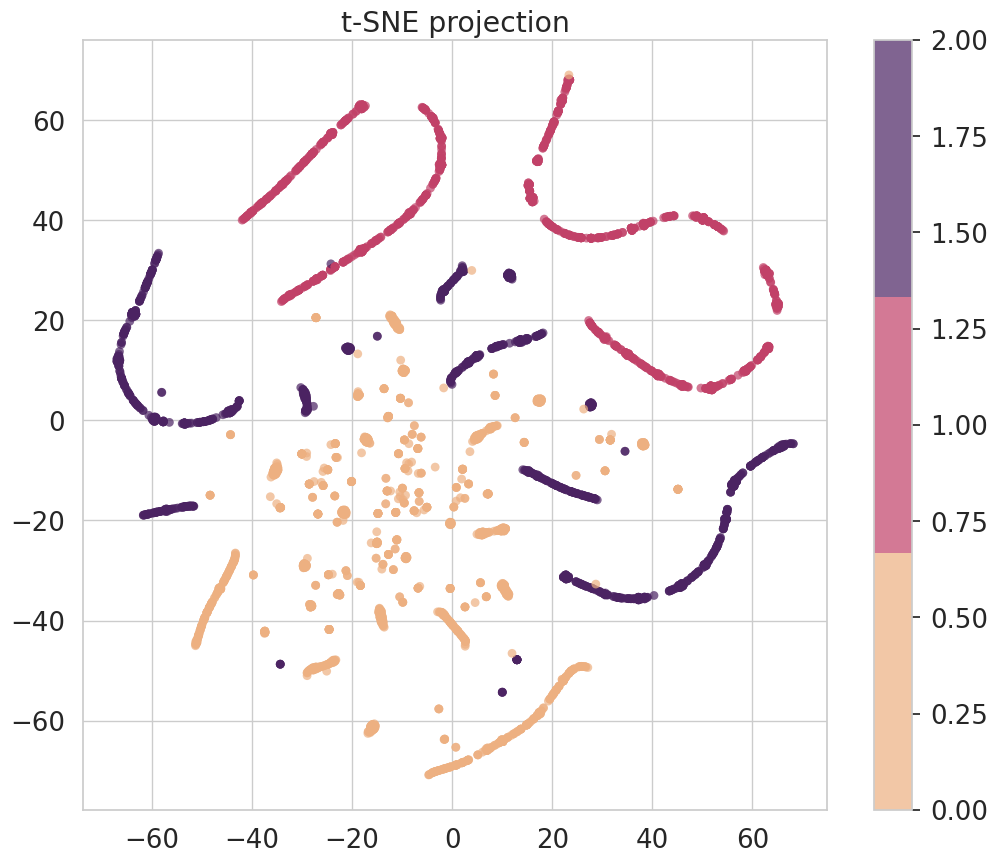

In [ ]:
TSNEplot(pred_ward)

In [ ]:
PCAplot3D(processed_df_copy, pred_ward)

In [ ]:
silhouette = silhouette_score(processed_df_copy, pred_ward)
chi = calinski_harabasz_score(processed_df_copy, pred_ward)
print('Agglomerative Clustering')
print('_'*45 + '\n')
print('Силуэт', round(silhouette,3))
print('Variance Rarion Criterion', round(chi,3))
rs_ward = rand_score(pred_ward, y)
print(" rand_score = {} \n\n {} из 3755 предсказано верно \n".format(rs_ward, rs_ward * 3755))

Agglomerative Clustering
_____________________________________________

Силуэт 0.208
Variance Rarion Criterion 649.322
 rand_score = 0.6613877288105293 

 2483.5109216835376 из 3755 предсказано верно 



In [ ]:
df_cluster['Agglomerative'] = pred_ward


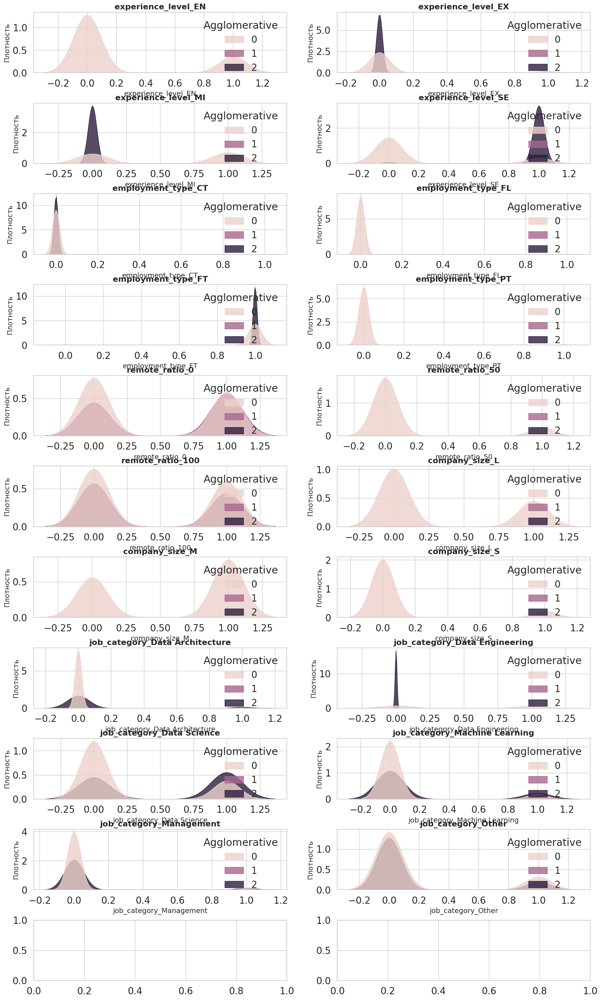

In [ ]:
# Создаем матрицу графиков для визуализации распредления по каждой переменной
fig, axes = plt.subplots(11,2, figsize = (20,35))

# Расстояние между графиками
plt.subplots_adjust(hspace=0.5)

# Список значений признаков для цикла
columns = processed_df_copy.columns[:-1]

# Строим распределения (kdeplot) для каждого признака
for i, column in enumerate(columns):
    ax = axes[i // 2, i % 2]
    sns.kdeplot(data = df_cluster,
                x = column,
                fill = True,
                alpha = 0.8,
                hue = 'Agglomerative',
                ax = ax)

    ax.set_title(column, fontweight = 'bold', fontsize = 16)
    ax.set_xlabel(column, fontsize = 14)
    ax.set_ylabel('Плотность', fontsize = 14)

**Spectral Clustering**

In [ ]:
clustering_sp = SpectralClustering(3).fit(processed_df_copy)
pred_sp = clustering_sp.labels_

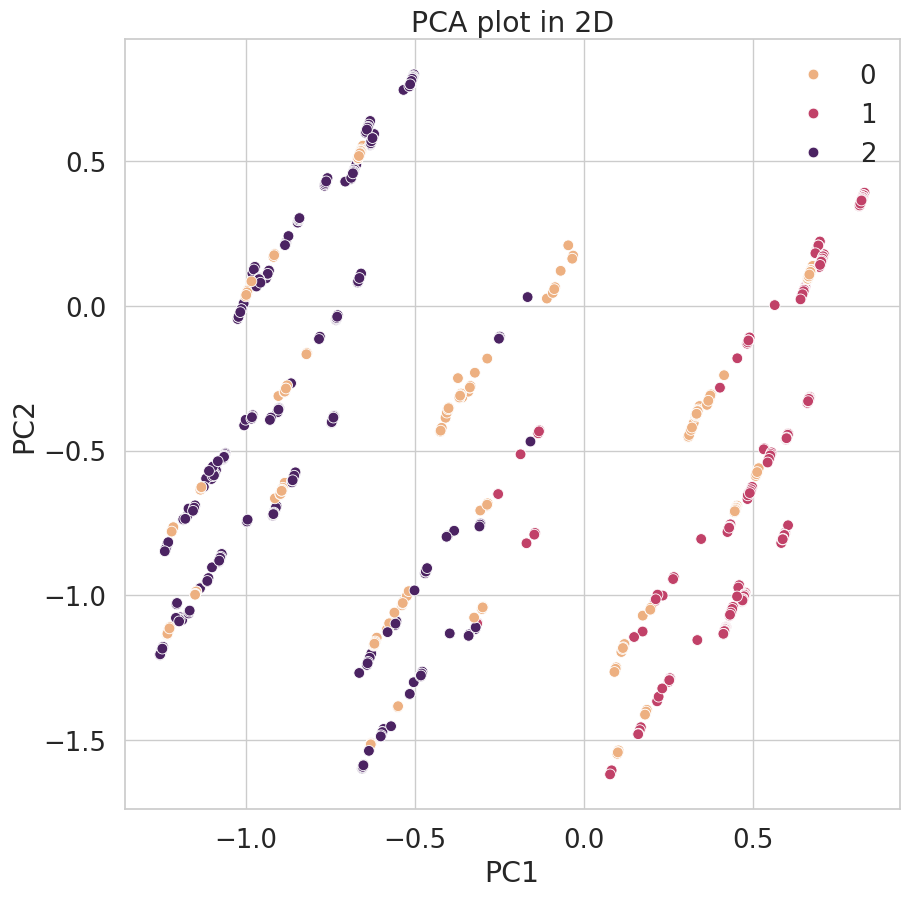

In [ ]:
fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x = principal_df.iloc[:,0],
                y = principal_df.iloc[:,1],
                hue = pred_sp,
                palette="flare",
                s=60)
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2');

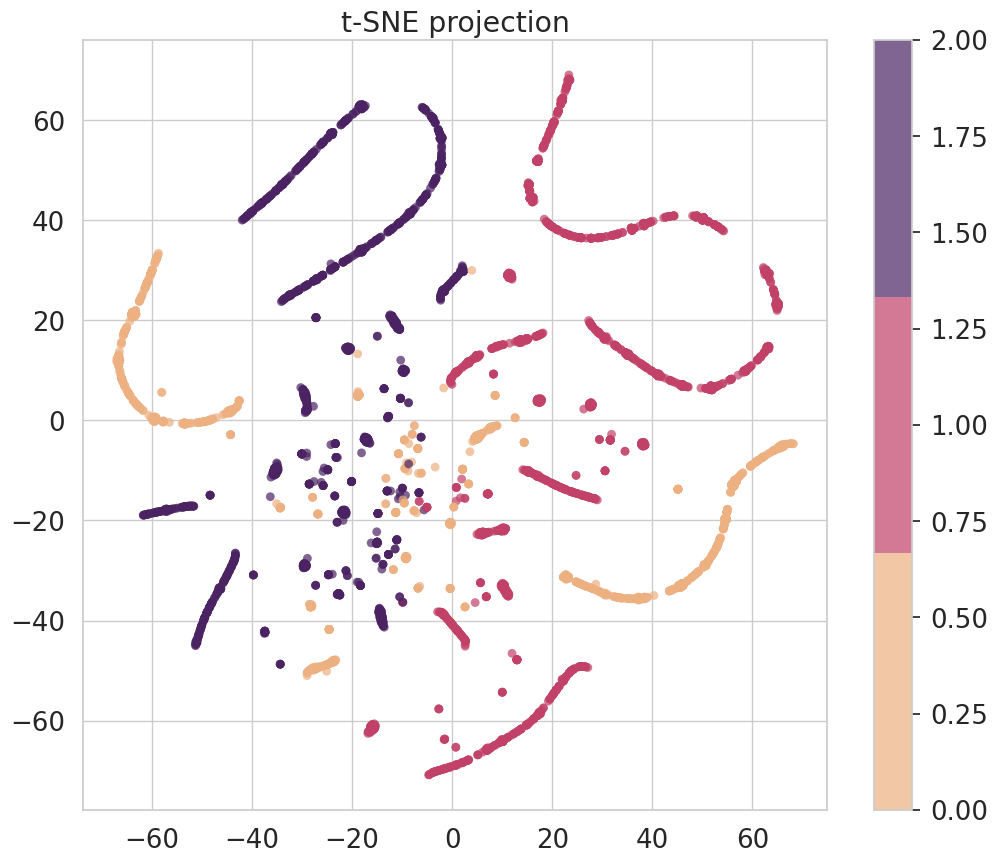

In [ ]:
TSNEplot(pred_sp)

In [ ]:
PCAplot3D(processed_df_copy, pred_sp)


In [ ]:
silhouette = silhouette_score(X, pred_sp)
chi = calinski_harabasz_score(X, pred_sp)
print('Spectral Clustering')
print('_'*45 + '\n')
print('Силуэт', round(silhouette,3))
print('Variance Rarion Criterion', round(chi,3))
rs_sp = rand_score(pred_sp, y)
print(" rand_score = {} \n\n {} из 3755 предсказано верно \n".format(rs_sp, rs_sp * 3755))

Spectral Clustering
_____________________________________________

Силуэт 0.288
Variance Rarion Criterion 832.053
 rand_score = 0.6571092920325732 

 2467.4453915823124 из 3755 предсказано верно 



In [ ]:
df_cluster['Spectral'] = pred_sp

**DBSCAN**

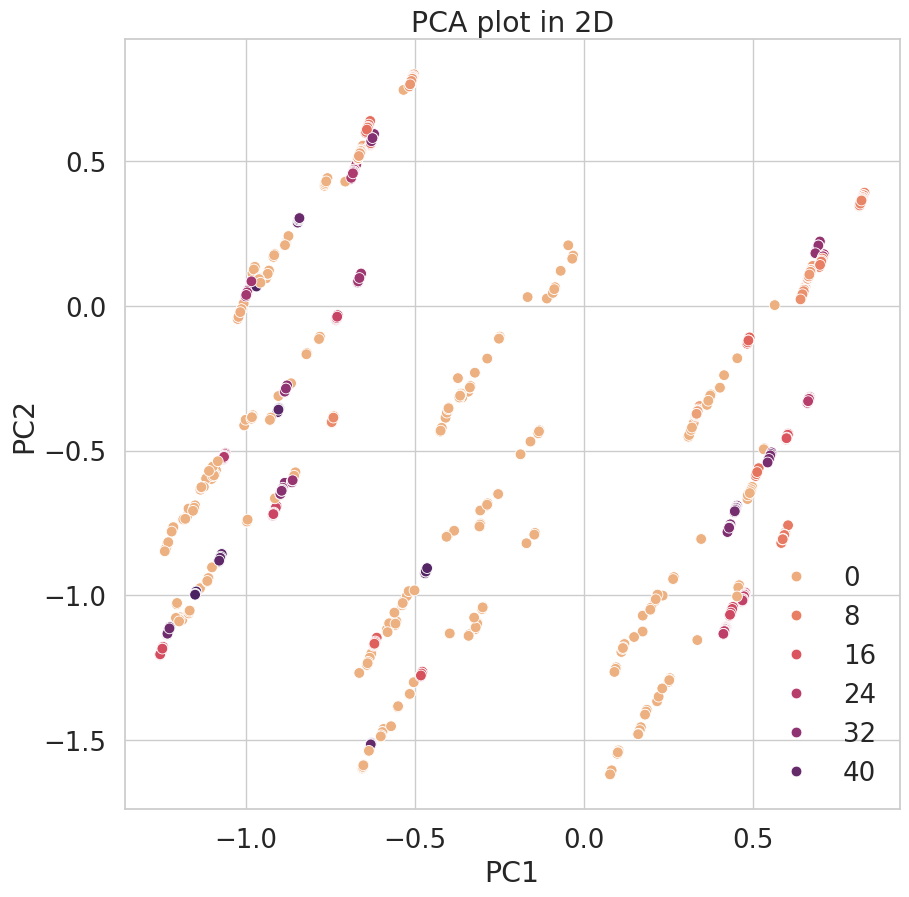

In [ ]:
from sklearn.cluster import DBSCAN
clustering_db = DBSCAN(eps=0.5, min_samples=10).fit(processed_df_copy)
pred_db = clustering_db.labels_
fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x = principal_df.iloc[:,0],
                y = principal_df.iloc[:,1],
                hue = pred_db,
                palette="flare",
                s=60)
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2');

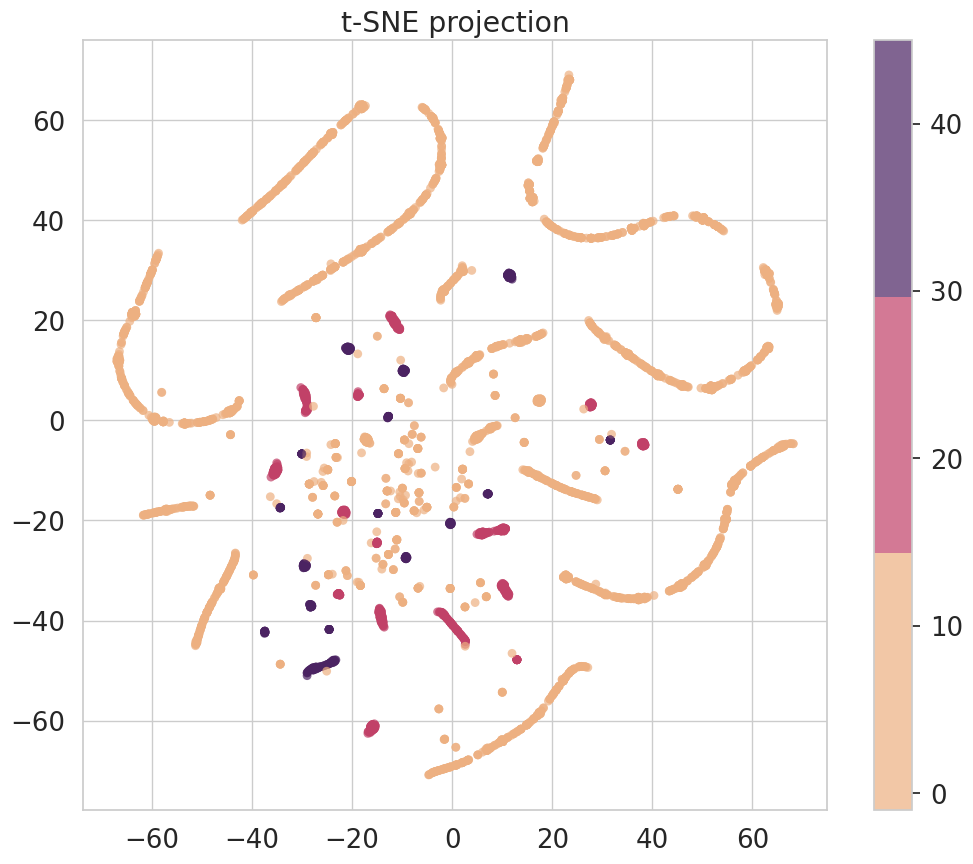

In [ ]:
TSNEplot(pred_db)

In [ ]:
PCAplot3D(processed_df_copy, pred_db)

In [ ]:
silhouette = silhouette_score(processed_df_copy, pred_db)
chi = calinski_harabasz_score(processed_df_copy, pred_db)
print('DBSCAN')
print('_'*45 + '\n')
print('Силуэт', round(silhouette,3))
print('Variance Rarion Criterion', round(chi,3))
rs_db = rand_score(pred_db, y)
print(" rand_score = {} \n\n {} из 3755 предсказано верно \n".format(rs_db, rs_db * 3755))

DBSCAN
_____________________________________________

Силуэт 0.787
Variance Rarion Criterion 440.275
 rand_score = 0.9175762098767972 

 3445.4986680873735 из 3755 предсказано верно 



In [ ]:
df_cluster['DBSCAN'] = pred_db

Предсказательная способность DBSCAN намного выше. Около 92% данных верно предсказаны.

In [ ]:
# Создаем матрицу графиков для визуализации распредления по каждой переменной
fig, axes = plt.subplots(11,2, figsize = (35,100), dpi=250)

# Расстояние между графиками
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Список значений признаков для цикла
columns = processed_df_copy.columns[:-1]

# Строим распределения (kdeplot) для каждого признака
for i, column in enumerate(columns):
    ax = axes[i // 2, i % 2]
    sns.kdeplot(data = df_cluster,
                x = column,
                fill = True,
                alpha = 0.8,
                hue = 'DBSCAN',
                ax = ax)

    ax.set_title(column, fontweight = 'bold', fontsize = 16)
    ax.set_xlabel(column, fontsize = 14)
    ax.set_ylabel('Плотность', fontsize = 14)

Методы, выбранные для моделирования, сработали отлично. DBSCAN показал себя достаточно хорошо, K-Means отработал вполне достойно, но Spectral Clustering и Agglomerative Clustering by Ward показали умеренные результаты, предсказав правильно почти 66% данных.

Agglomerative Clustering и Spectral Clustering показали лучшие результаты по Rand Score и количеству правильно предсказанных объектов.
K-Means показал средние результаты, а DBSCAN - наилучшие.
Выбор лучшего алгоритма зависит от конкретных требований к качеству кластеризации.
Если требуется высокая точность, то Agglomerative Clustering или Spectral Clustering могут быть лучшим выбором.
Если же требуется простота и скорость, то K-Means может быть приемлемым вариантом.
Silhouette:
Оценивает, насколько хорошо точки данных в кластере похожи на другие точки в том же кластере и непохожи на точки в других кластерах.
Значение silhouette колеблется от -1 до 1, где 1 означает идеальную кластеризацию, а 0 означает случайное распределение кластеров.
В данном случае silhouette для всех алгоритмов показывает ниже 0.3, это указывает на слабую кластеризацию.
Variance Ratio Criterion:
Оценивает степень, в которой кластеры сформированы точками, которые близки друг к другу.
Более низкие значения указывают на более компактные кластеры.
В данном случае все алгоритмы, за исключением DBSCAN, показывают схожие значения, что говорит об умеренной дисперсии кластеров.

In [ ]:
df_cluster[['K-Means','Agglomerative', 'Spectral', 'DBSCAN']]

,K-Means,Agglomerative,Spectral,DBSCAN
0,1,0,2,0
1,2,0,2,-1
2,2,0,2,-1
3,1,2,0,1
4,1,2,0,1
...,...,...,...,...
3750,1,0,0,28
3751,2,0,2,18
3752,1,0,0,-1
3753,1,0,2,-1
